In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
import matplotlib as mpl
%matplotlib inline

# Read train.csv

In [2]:
data_dir = "/Users/ashok/Downloads/Chexpert/"

In [3]:
train = pd.read_csv(os.path.join(data_dir, "CheXpert-v1.0-small/train.csv"))
train["patient"] = train.Path.apply(lambda x: x.split("/")[2])
train["study"] = train.Path.apply(lambda x: x.split("/")[3])
train["view"] = train.Path.apply(lambda x: x.split("/")[4].split("_")[0])
# train = train.loc[:, train.columns != 'Path']

In [4]:
total_images = train.shape[0]
print("Number of images:   {:,}".format(total_images))
print("Number of patients:  {:,}".format(len(train.patient.unique())))

Number of images:   223,414
Number of patients:  64,540


# Getting pathology counts

In [5]:
diseases = ['No Finding',
       'Enlarged Cardiomediastinum', 'Cardiomegaly', 'Lung Opacity',
       'Lung Lesion', 'Edema', 'Consolidation', 'Pneumonia', 'Atelectasis',
       'Pneumothorax', 'Pleural Effusion', 'Pleural Other', 'Fracture',
       'Support Devices']

In [6]:
def get_counts(train, disease):
    df = train.groupby(disease, as_index=False)["Path"]\
    .count()\
    .rename({disease: "Pathology"}, axis=1)\
    .rename({"Path": disease}, axis=1)\
    .set_index("Pathology")\
    .T\
    .rename({-1.0: "Negative", 0.0: "Uncertain", 1.0: "Positive"}, axis=1)
    
    return df

def get_all_counts(train, diseases):
    all_counts = pd.DataFrame({"Pathology": [], "Negative": [], "Uncertain": [], "Positive": []})\
    .set_index("Pathology")
    
    for disease in diseases:
        count_disease = get_counts(train, disease)
        all_counts = pd.concat((all_counts, count_disease), axis=0, sort=True)
    
    all_counts = all_counts.fillna(0)[["Positive", "Uncertain", "Negative"]]
    
    all_counts["Missing"] = all_counts.apply(lambda row: total_images - row["Negative"] - row["Uncertain"] - row["Positive"], 
                                             axis=1)
    
    all_counts["Positive"] = all_counts["Positive"].astype(np.int32)
    all_counts["Uncertain"] = all_counts["Uncertain"].astype(np.int32)
    all_counts["Negative"] = all_counts["Negative"].astype(np.int32)
    all_counts["Missing"] = all_counts["Missing"].astype(np.int32)
    
    
    all_counts["Positive%"] = all_counts.Positive.apply(lambda x: np.round(x / total_images*100,1))
    all_counts["Uncertain%"] = all_counts.Uncertain.apply(lambda x: np.round(x / total_images*100,1))
    all_counts["Negative%"] = all_counts.Negative.apply(lambda x: np.round(x / total_images*100,1))
    all_counts["Missing%"] = all_counts.Missing.apply(lambda x: np.round(x / total_images*100,1))
    
    return all_counts

In [7]:
all_counts = get_all_counts(train, diseases)
all_counts

,Positive,Uncertain,Negative,Missing,Positive%,Uncertain%,Negative%,Missing%
No Finding,22381,0,0,201033,10.0,0.0,0.0,90.0
Enlarged Cardiomediastinum,10798,21638,12403,178575,4.8,9.7,5.6,79.9
Cardiomegaly,27000,11116,8087,177211,12.1,5.0,3.6,79.3
Lung Opacity,105581,6599,5598,105636,47.3,3.0,2.5,47.3
Lung Lesion,9186,1270,1488,211470,4.1,0.6,0.7,94.7
Edema,52246,20726,12984,137458,23.4,9.3,5.8,61.5
Consolidation,14783,28097,27742,152792,6.6,12.6,12.4,68.4
Pneumonia,6039,2799,18770,195806,2.7,1.3,8.4,87.6
Atelectasis,33376,1328,33739,154971,14.9,0.6,15.1,69.4
Pneumothorax,19448,56341,3145,144480,8.7,25.2,1.4,64.7


# Distributions

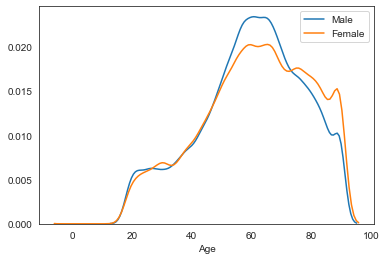

In [8]:
# Age distribution
sns.set_style("white")
sns.distplot(train[train.Sex=="Male"]["Age"], hist=False, label="Male")
sns.distplot(train[train.Sex=="Female"]["Age"], hist=False, label="Female")
plt.legend()

In [9]:
# Counts by Sex
train.groupby("Sex", as_index=False)["Path"].count()

,Sex,Path
0,Female,90777
1,Male,132636
2,Unknown,1


In [10]:
# Counts by view type
train["Frontal/Lateral"].fillna("Missing").reset_index().groupby("Frontal/Lateral",as_index=False).count()

,Frontal/Lateral,index
0,Frontal,191027
1,Lateral,32387


In [45]:
1-191027/total_images

0.1449640577582425

In [11]:
# Counts by AP/PA
train["AP/PA"].fillna("Missing").reset_index().groupby("AP/PA",as_index=False).count()

,AP/PA,index
0,AP,161590
1,LL,16
2,Missing,32387
3,PA,29420
4,RL,1


In [12]:
# Counts by AP/PA
train[["Frontal/Lateral", "AP/PA"]].fillna("Missing")\
    .reset_index()\
    .groupby(["Frontal/Lateral", "AP/PA"],as_index=False)\
    .count()

,Frontal/Lateral,AP/PA,index
0,Frontal,AP,161590
1,Frontal,LL,16
2,Frontal,PA,29420
3,Frontal,RL,1
4,Lateral,Missing,32387


# Patients with maximum images

In [18]:
images_by_patient = train.groupby("patient", as_index=False)["Path"]\
    .count()\
    .sort_values("Path", ascending=False)\
    .rename({"Path": "count"}, axis=1)

images_by_patient["images_ratio"] = images_by_patient["count"] / total_images

images_by_patient.head(5)

,patient,count,images_ratio
28745,patient28746,92,0.000412
33154,patient33155,92,0.000412
4461,patient04462,89,0.000398
24162,patient24163,86,0.000385
34614,patient34615,85,0.000380


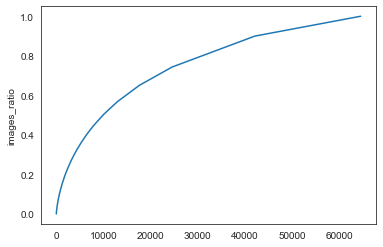

In [25]:
cumsum = images_by_patient.images_ratio.cumsum()
sns.lineplot(x=range(len(cumsum)), y=cumsum)

In [42]:
total_patients = len(cumsum)
print("Total patients: {:,}".format(total_patients))
for percent in np.linspace(0.5, 1, 6):
    percent_patients = np.sum(cumsum <= percent) / total_patients
    print("{:3.0f}% images contributed by {:5.1f}% patients".format(percent*100, percent_patients*100))

Total patients: 64,540
 50% images contributed by  15.3% patients
 60% images contributed by  22.9% patients
 70% images contributed by  33.0% patients
 80% images contributed by  47.9% patients
 90% images contributed by  65.4% patients
100% images contributed by 100.0% patients


In [43]:
np.sum(cumsum <= 0.8)

30908

# Cross tabs with pathologies

In [190]:
def get_count_by_feature(train, disease, feature, filtered):
    total_counts = train.groupby(feature, as_index=False)["Path"]\
        .count()\
        .rename({"Path": "total_count"}, axis=1)\
        .query("{0} != '{1}'".format(feature, filtered))

    d = train[train[disease] == 1].groupby(feature, as_index=False)["Path"]\
        .count()\
        .rename({"Path": disease}, axis=1)

    merged = pd.merge(d, total_counts)
    merged["positive%"] = merged[disease] / merged["total_count"]
    return merged[[feature, "positive%"]].rename({"positive%": disease}, axis=1)\
        .set_index(feature)\
        .T

# Male v/s female

In [239]:
all_counts = pd.DataFrame({"Sex": [], "Female": [], "Male": []})\
    .set_index("Sex")
    
for disease in diseases:
    count_disease = get_count_by_feature(train, disease, "Sex", "Unknown")
    all_counts = pd.concat((all_counts, count_disease), axis=0, sort=True)
    
all_counts["difference"] = all_counts["Male"] - all_counts["Female"]
all_counts.sort_values(by="difference", inplace=True)

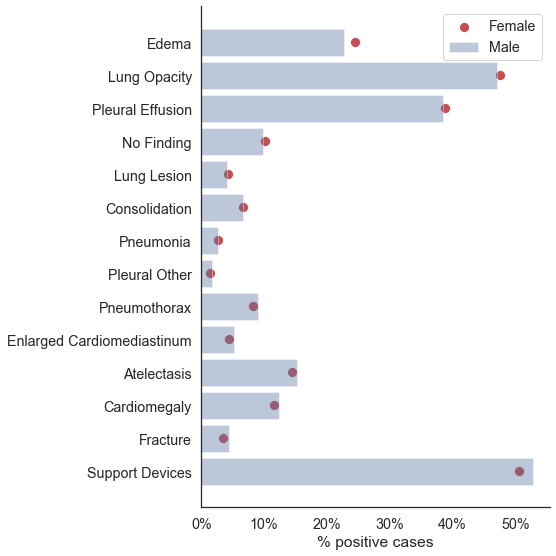

In [240]:
sns.set(font_scale=1.3)  # crazy big
sns.set_style("white")
plt.figure(figsize=(8,8))

sns.barplot(y=all_counts.index, x=all_counts["Male"], color="b", alpha=0.4, label="Male")
sns.scatterplot(y=all_counts.index, x=all_counts["Female"], color="r", label="Female", s=100)
plt.xlabel("% positive cases")
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['top'].set_visible(False)
plt.gca().xaxis.set_major_formatter(mpl.ticker.FuncFormatter(lambda y, _: '{:.0%}'.format(y))) 

plt.tight_layout()

plt.savefig("../figures/exploratory-01.png", dpi=300)

# Frontal v/s lateral

In [241]:
all_counts = pd.DataFrame({"FA": [], "Frontal": [], "Lateral": []})\
    .set_index("FA")
    
for disease in diseases:
    count_disease = get_count_by_feature(train.rename({"Frontal/Lateral": "FA"}, axis=1), disease, "FA", "Nothing")
    all_counts = pd.concat((all_counts, count_disease), axis=0, sort=True)
    
all_counts["difference"] = all_counts["Frontal"] - all_counts["Lateral"]
all_counts.sort_values(by="difference", inplace=True)

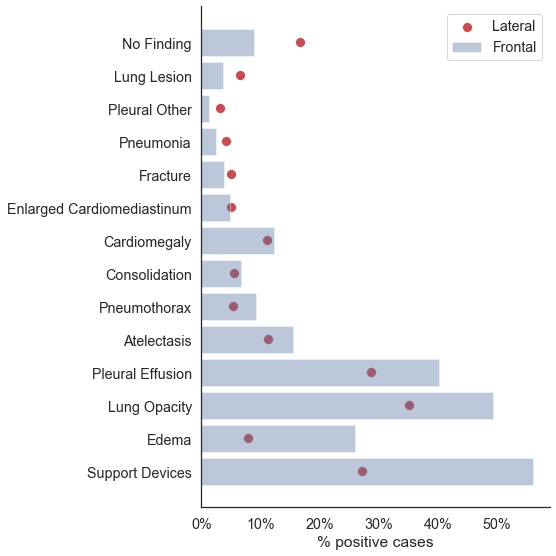

In [242]:
sns.set(font_scale=1.3)  # crazy big
sns.set_style("white")
plt.figure(figsize=(8,8))

sns.barplot(y=all_counts.index, x=all_counts["Frontal"], color="b", alpha=0.4, label="Frontal")
sns.scatterplot(y=all_counts.index, x=all_counts["Lateral"], color="r", label="Lateral", s=100)
plt.xlabel("% positive cases")
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['top'].set_visible(False)
plt.gca().xaxis.set_major_formatter(mpl.ticker.FuncFormatter(lambda y, _: '{:.0%}'.format(y))) 
plt.tight_layout()
plt.savefig("../figures/exploratory-02.png", dpi=300)

# Positive cases with age

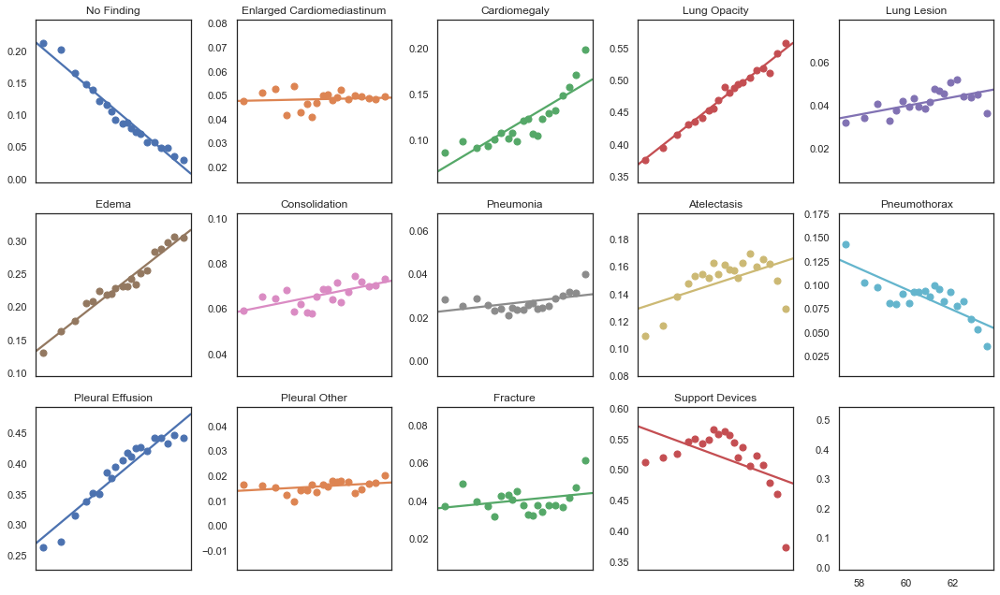

In [221]:
df = train[train.Age > 0].copy()

sns.set(font_scale=1.0)  # crazy big
sns.set_style("white")
f, axes = plt.subplots(3, 5, figsize=(15,9))

for i, row in enumerate(axes):
    for j, ax in enumerate(row):
        index = i*5 + j
        if index < 14:
            sns.regplot(df["Age"], (df[diseases[index]] == 1)*1.0, 
                        x_estimator=np.mean, 
                        fit_reg=True, 
                        x_bins=20, 
                        ci=None,
                        ax=ax)
            ax.set_ylabel(None)
            ax.set_xlabel(None)
            ax.set_title(diseases[index])
            ax.set_xticks([])
            
            
plt.tight_layout()

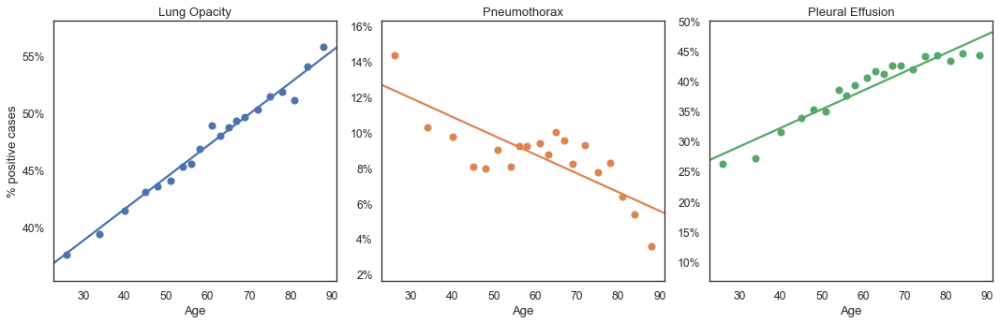

In [232]:
sns.set(font_scale=1.1)  # crazy big
sns.set_style("white")
f, axes = plt.subplots(1, 3, figsize=(15,5))

diseases_subset = ["Lung Opacity", "Pneumothorax", "Pleural Effusion"]
for ax, disease in zip(axes, diseases_subset):
    sns.regplot(df["Age"], (df[disease] == 1)*1.0, 
                x_estimator=np.mean, 
                fit_reg=True, 
                x_bins=20, 
                ci=None,
                ax=ax)
    ax.set_ylabel(None)
    ax.set_title(disease)
    ax.yaxis.set_major_formatter(mpl.ticker.FuncFormatter(lambda y, _: '{:.0%}'.format(y))) 
    if ax == axes[0]:
        ax.set_ylabel("% positive cases")


plt.tight_layout()
plt.savefig("../figures/exploratory-03.png", dpi=300)

# Samples images for each pathology

In [63]:
def get_indices(train, disease, samples=5):
    positive_all = train[train[disease] == 1].index
    uncertain_all = train[train[disease] == 0].index
    negative_all = train[train[disease] == -1].index
    
    positive = np.random.choice(positive_all, samples, replace=False)
    uncertain = np.random.choice(uncertain_all, samples, replace=False)
    negative = np.random.choice(negative_all, samples, replace=False)
    
    return positive, uncertain, negative

def get_image(index):
    filepath = train.loc[index].Path
    return plt.imread(os.path.join(data_dir, filepath))

def display_image(image, ax):
    ax.imshow(image, cmap=plt.cm.Greys_r)
    ax.set_xticks([])
    ax.set_yticks([])
    
def plot_sample_images(disease, seed=1, samples=5):
    f, axes = plt.subplots(3,samples)
    f.set_figwidth(18)
    f.set_figheight(9)

    p, u, n = get_indices(train, disease)
    for i, row in enumerate(axes):
        for j, ax in enumerate(row):
            if i == 0:
                index = p[j]
                if j == 0:
                    ax.set_ylabel("Positive")
            if i == 1:
                index = u[j]
                if j == 0:
                    ax.set_ylabel("Uncertain")
            if i == 2:
                index = n[j]
                if j == 0:
                    ax.set_ylabel("Negative")
            im = get_image(index)
            display_image(im, ax)
            ax.set_title(index)

    plt.tight_layout()
    plt.show()

# No finding

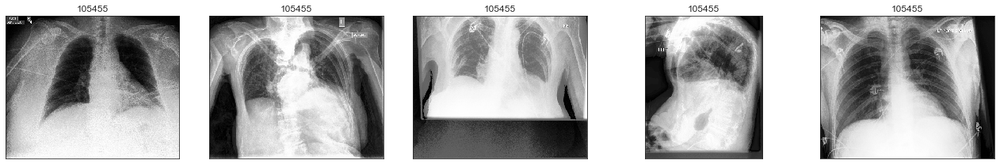

In [103]:
f, axes = plt.subplots(1,5)
f.set_figwidth(18)
f.set_figheight(3)

p = np.random.choice(train[train[diseases[0]] == 1].index, 5, replace=False)
for j, ax in enumerate(axes):
    im = get_image(j)
    display_image(im, ax)
    ax.set_title(index)

plt.tight_layout()
plt.show()

# With pathology

---------------------------------------- Enlarged Cardiomediastinum ----------------------------------------


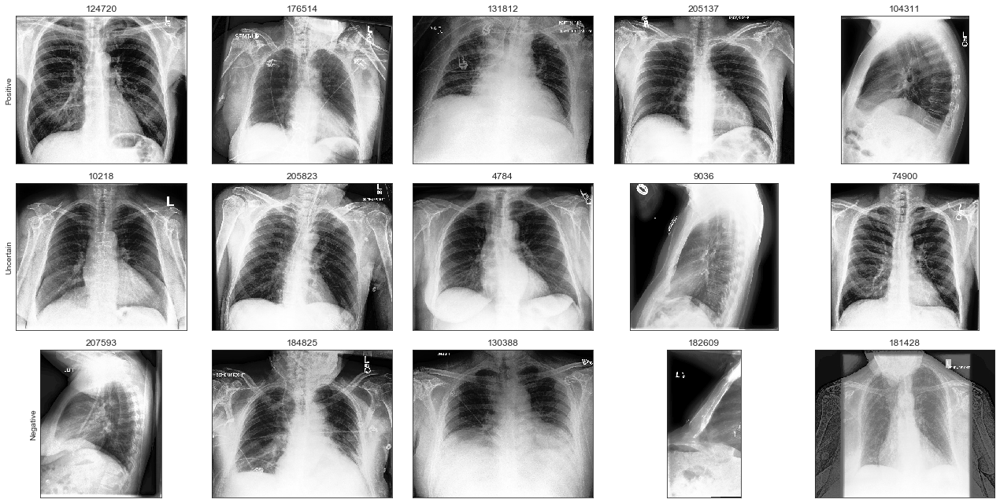

---------------------------------------- Cardiomegaly ----------------------------------------


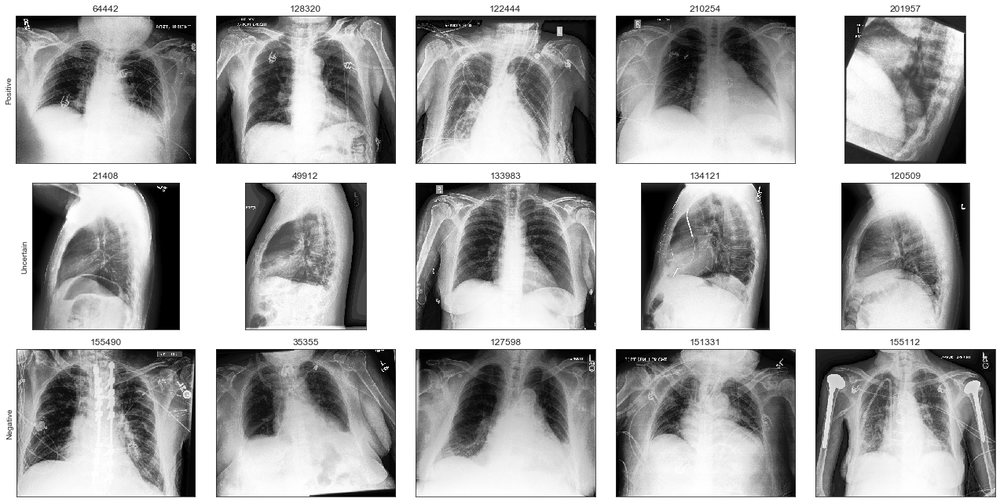

---------------------------------------- Lung Opacity ----------------------------------------


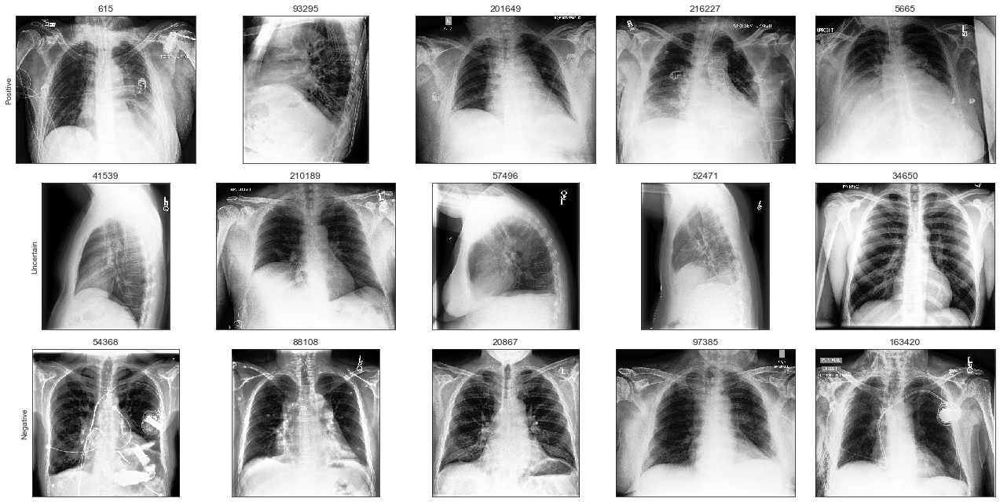

---------------------------------------- Lung Lesion ----------------------------------------


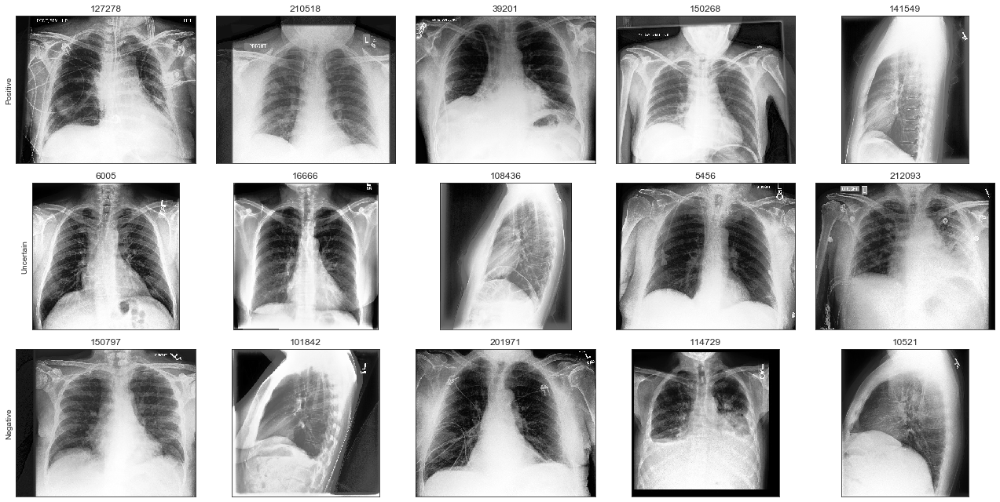

---------------------------------------- Edema ----------------------------------------


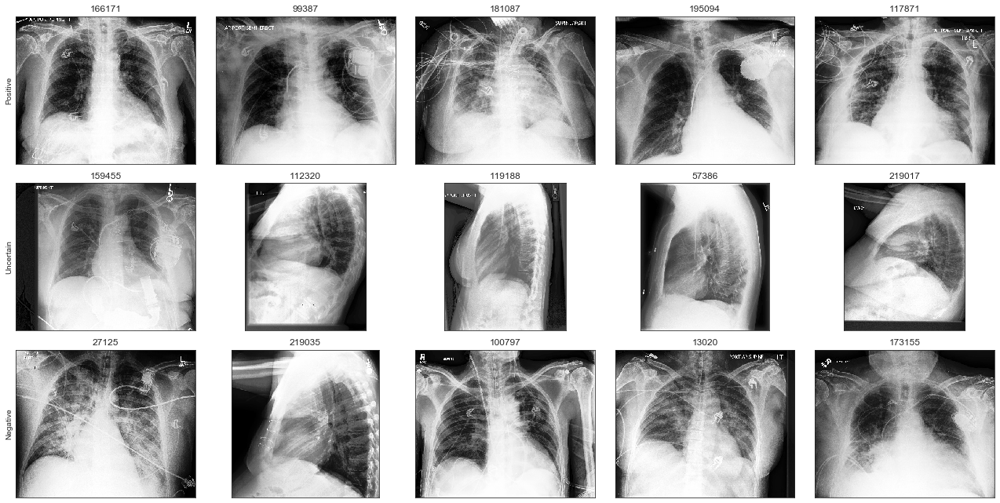

---------------------------------------- Consolidation ----------------------------------------


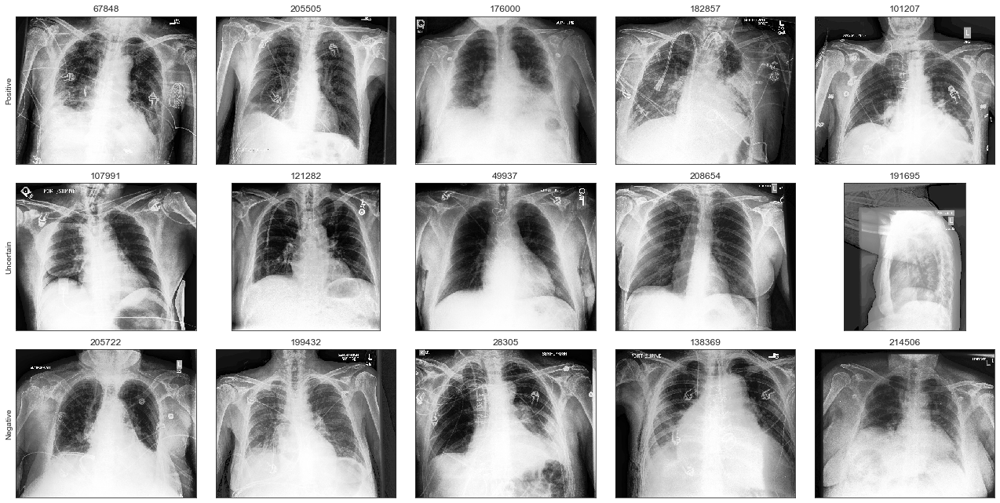

---------------------------------------- Pneumonia ----------------------------------------


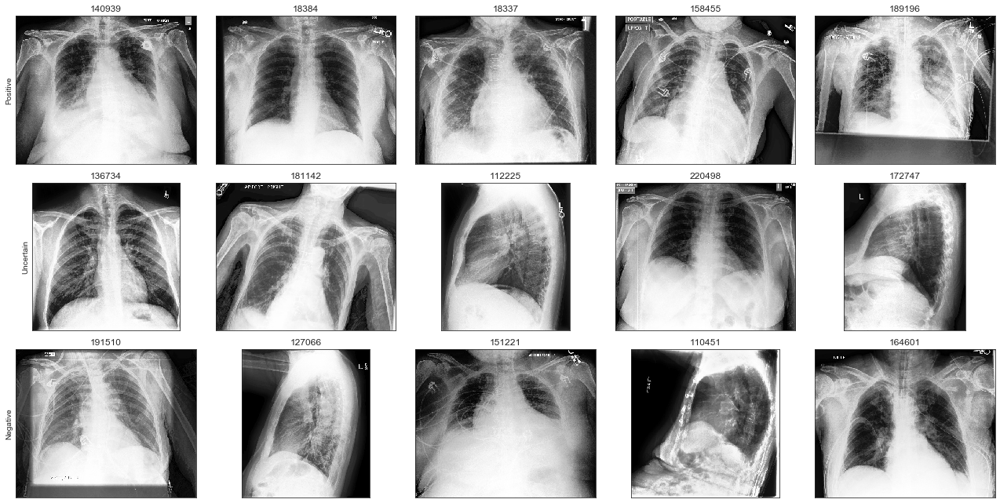

---------------------------------------- Atelectasis ----------------------------------------


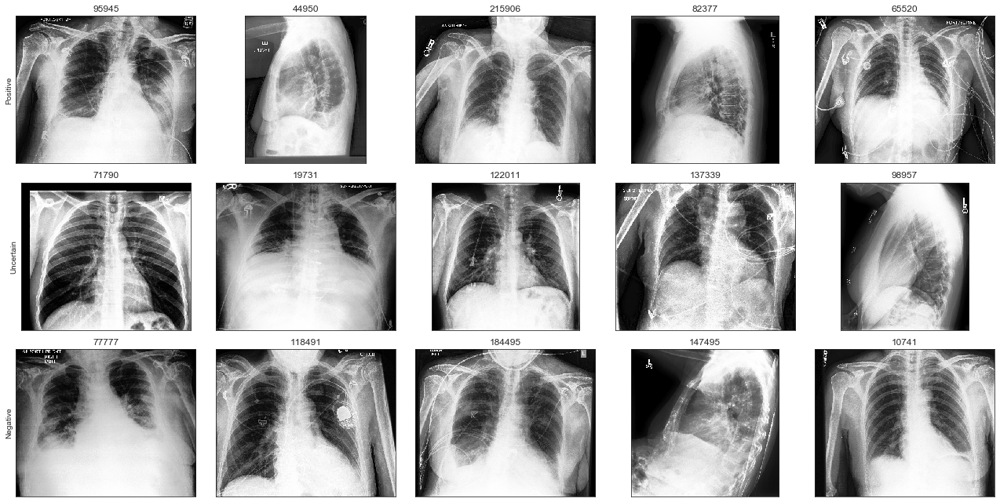

---------------------------------------- Pneumothorax ----------------------------------------


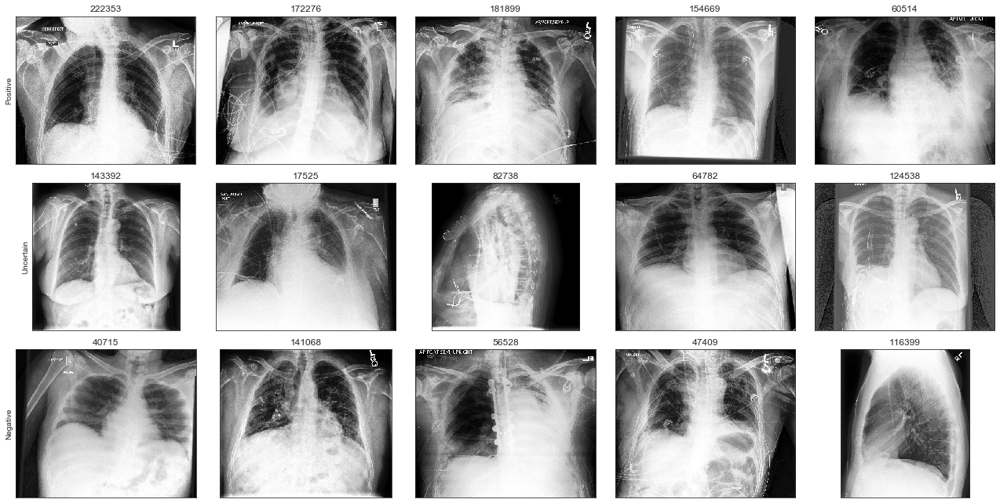

---------------------------------------- Pleural Effusion ----------------------------------------


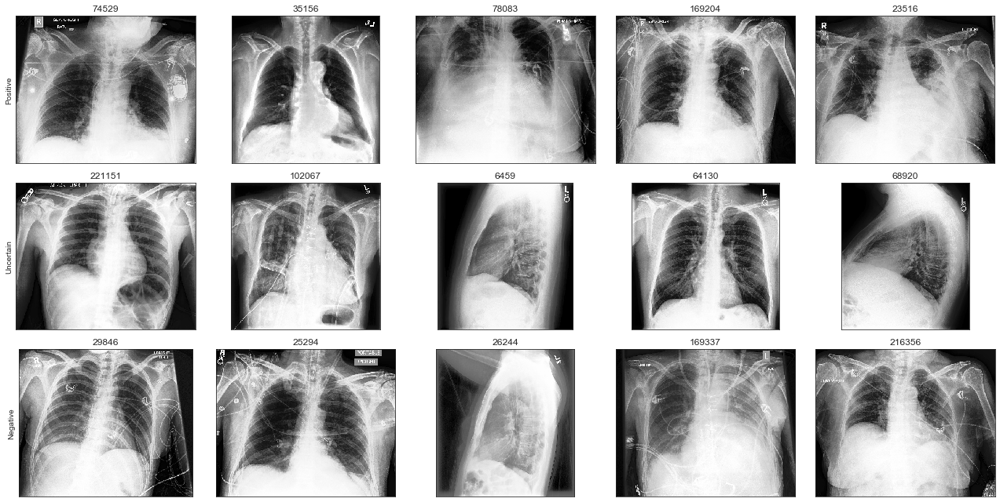

---------------------------------------- Pleural Other ----------------------------------------


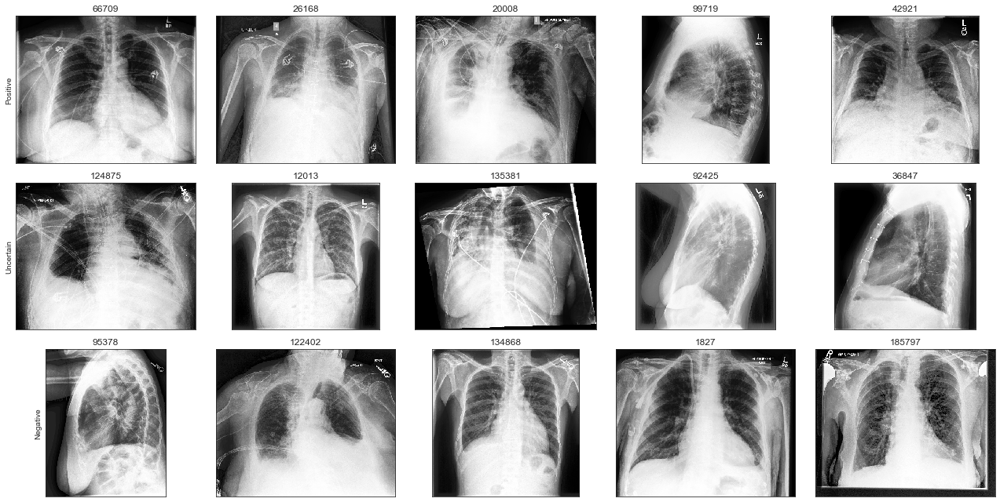

---------------------------------------- Fracture ----------------------------------------


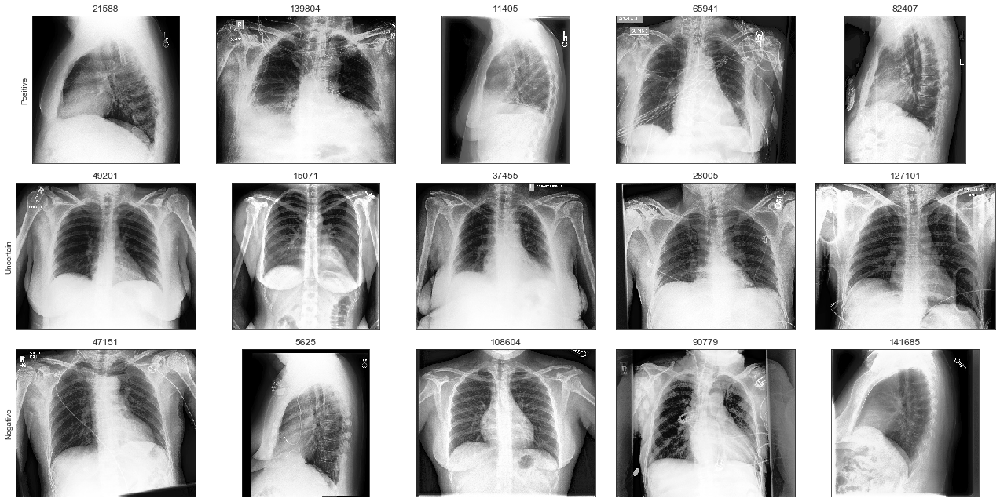

---------------------------------------- Support Devices ----------------------------------------


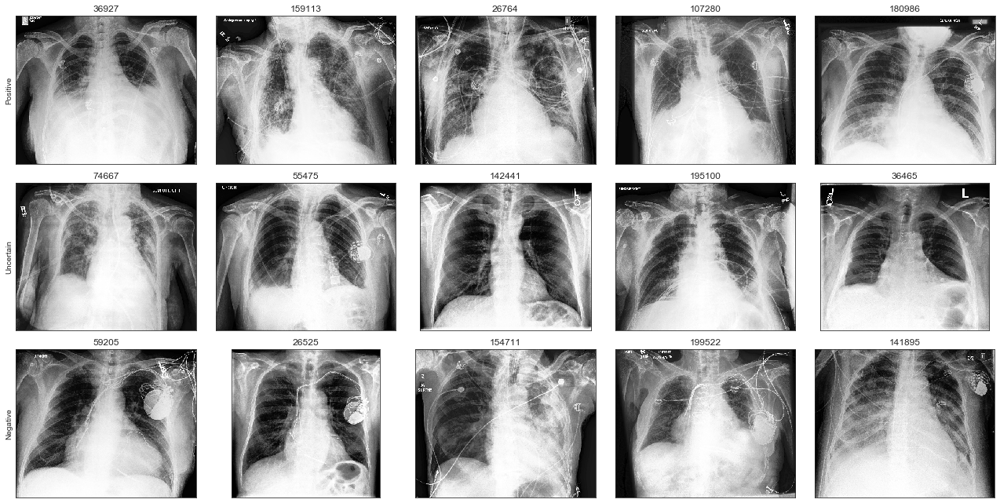

In [96]:
for disease in diseases[1:]:
    print("-"*40, disease, "-"*40)
    plot_sample_images(disease)